<h1> Análise Conjunto de Dados de Vinhos Tintos</h1>

In [22]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib as mpl
import matplotlib.pyplot as plt
#%matplotlib inline
import seaborn as sns
import scipy.stats as st
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import missingno as msno
from sklearn import preprocessing
from sklearn.metrics import f1_score, confusion_matrix,accuracy_score, classification_report


In [23]:
df = pd.read_csv('datasets/winequality-red.csv', sep=';')

In [24]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


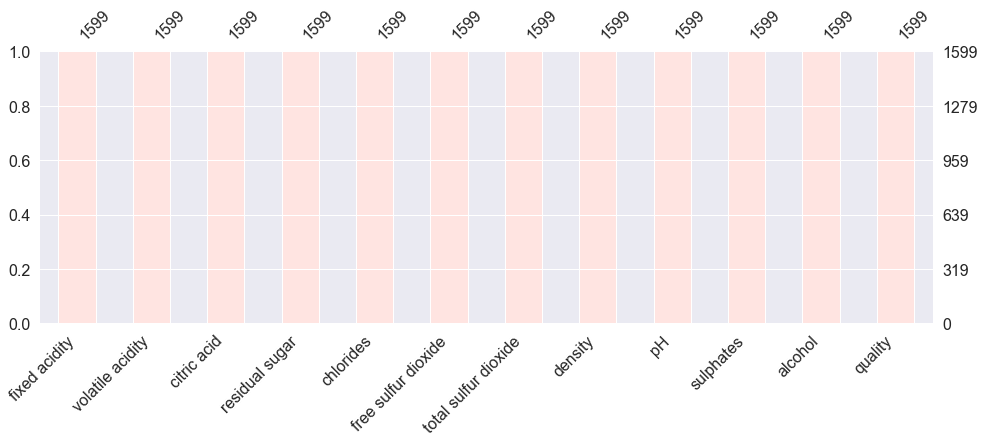

In [26]:
msno.bar(df, figsize = (16,5),color = "#FFE4E1")
plt.show()

In [27]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [28]:
df.duplicated().value_counts()

False    1359
True      240
dtype: int64

In [29]:
df.drop_duplicates(keep='first', inplace=True)

In [30]:
df.duplicated().value_counts()

False    1359
dtype: int64

In [31]:
columns=df.columns


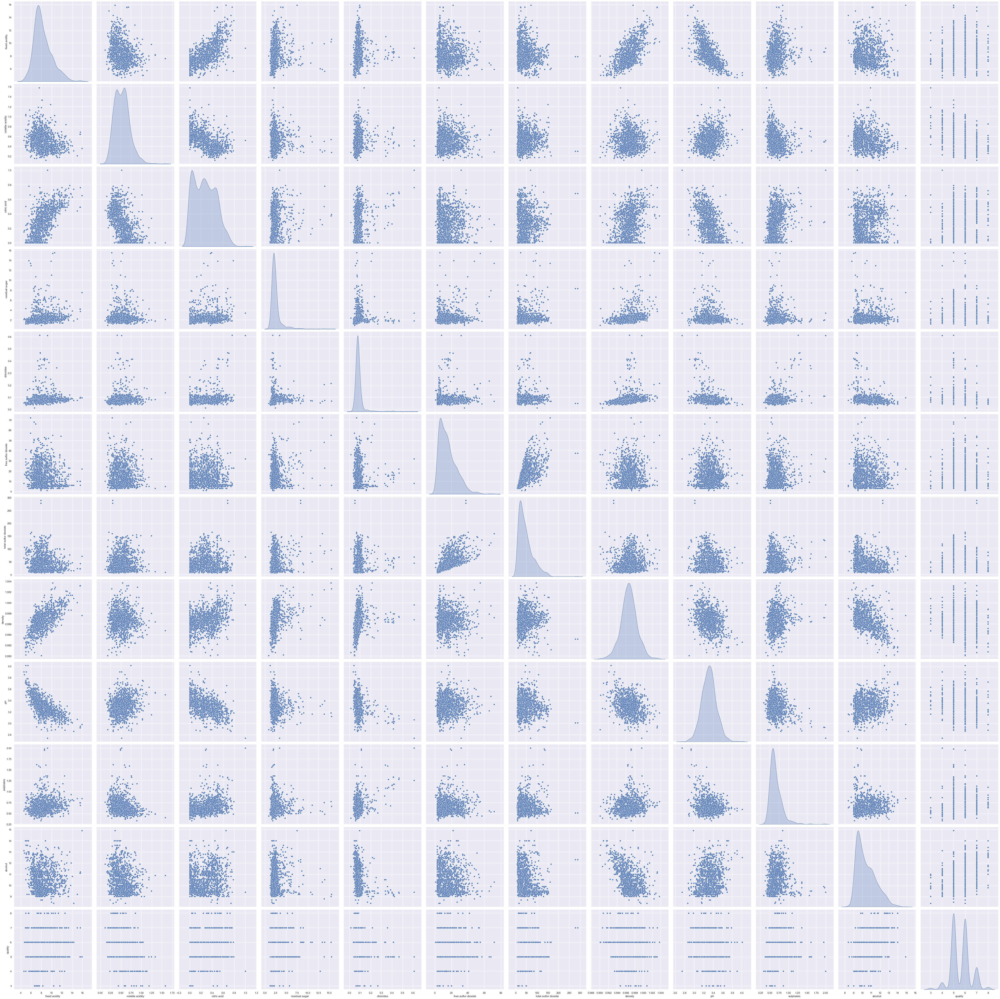

In [32]:
sns.set()
sns.pairplot(df[columns],height = 5 ,kind ='scatter',diag_kind='kde')
plt.show()

In [33]:
fig = go.Figure(data=[go.Pie(labels=df['quality'].value_counts().index, values=df['quality'].value_counts(), hole=.3)])
fig.update_layout(legend_title_text='Quality')
fig.show()

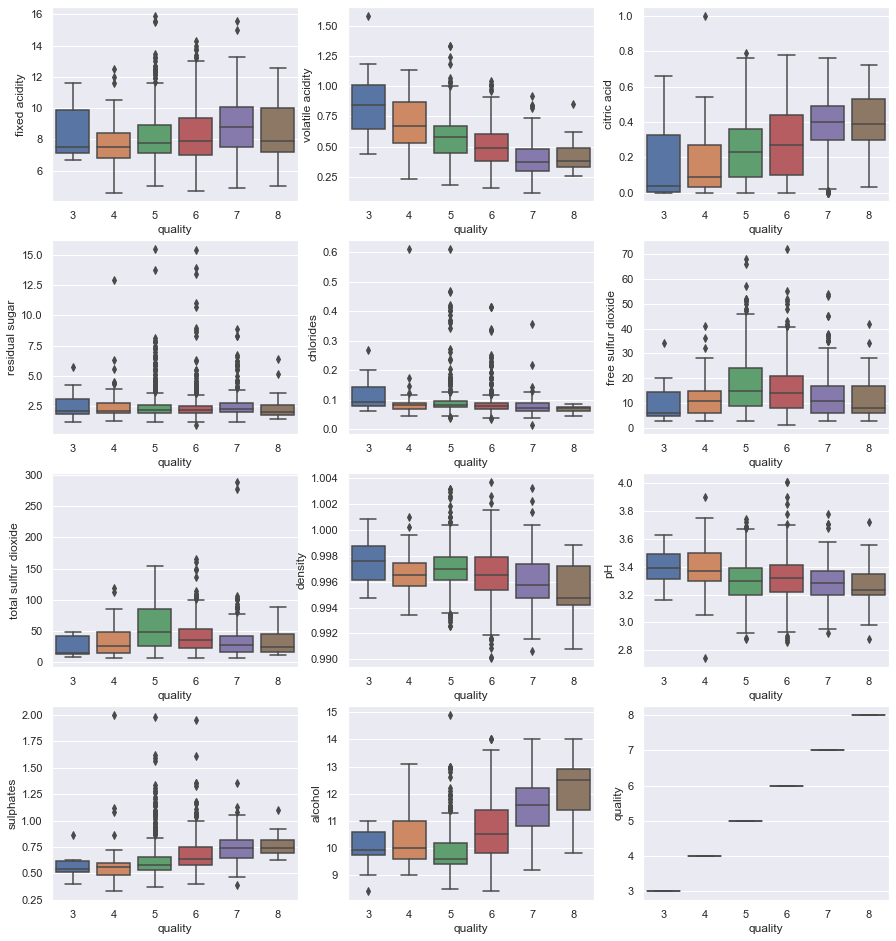

In [34]:
i=1
plt.figure(figsize=(15,25))
for feature in columns:
    plt.subplot(6,3,i)
    sns.boxplot(y=df[feature], x = df['quality'])
    i+=1

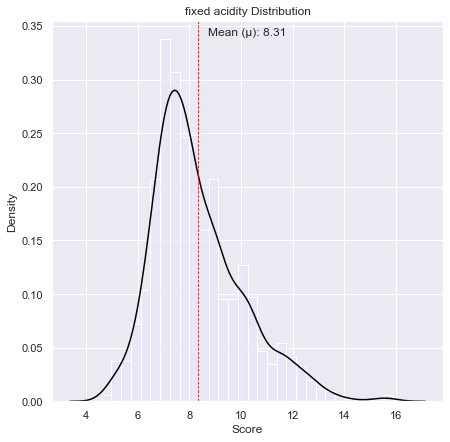

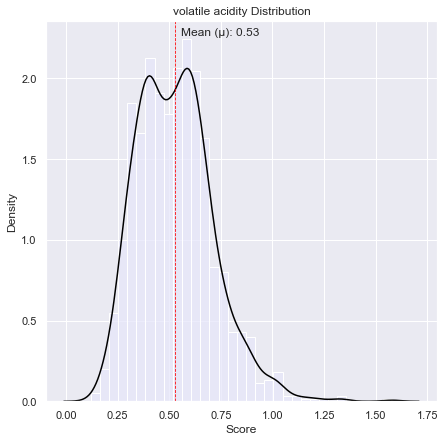

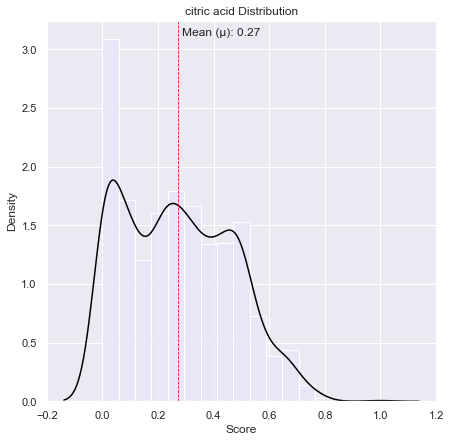

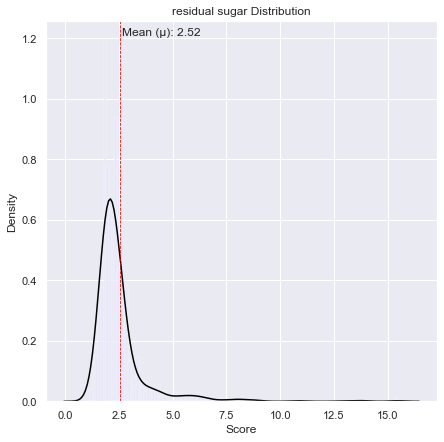

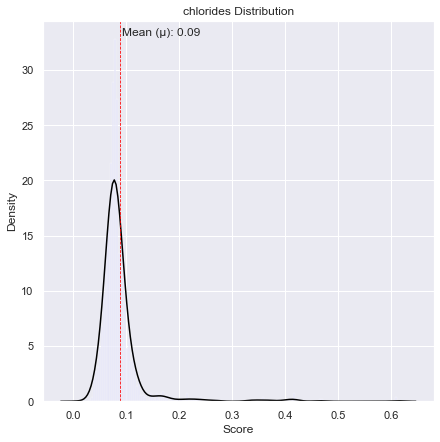

...

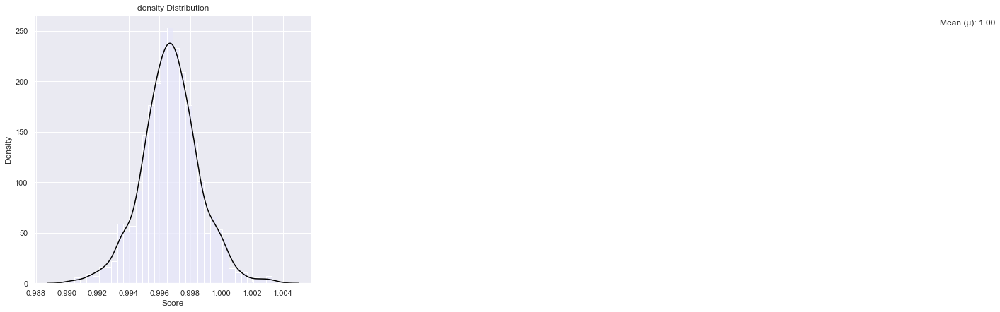

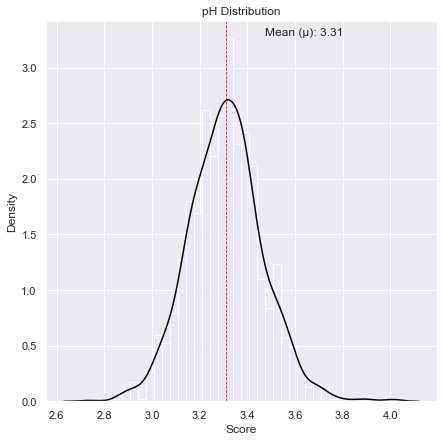

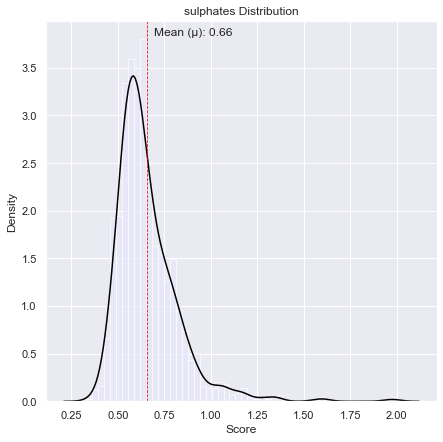

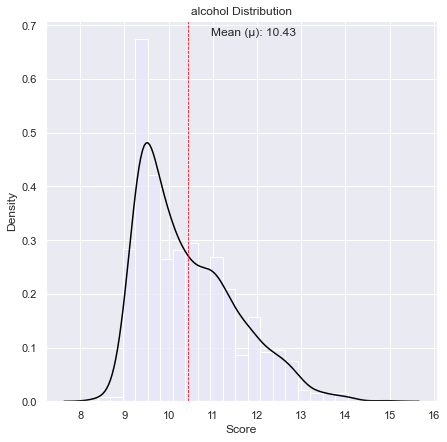

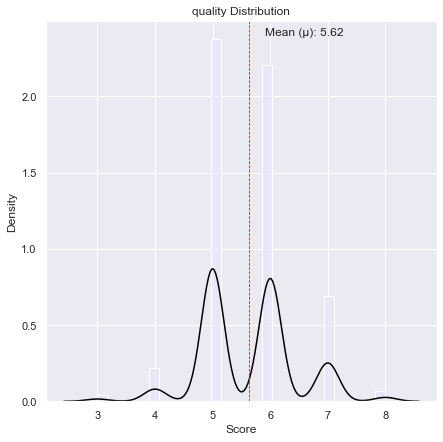

In [35]:
for column_name in df.columns:
  plt.figure(figsize=(7, 7))
  plt.title("{column_name} Distribution".format(column_name = column_name))
  sns.histplot(df[column_name], stat='density',color='#E6E6FA')
  sns.kdeplot(df[column_name], color='black')
  plt.axvline(df[column_name].mean(), color='red', linestyle='--', linewidth=0.8)
  min_ylim, max_ylim = plt.ylim()
  plt.text(df[column_name].mean()*1.05, max_ylim*0.96, 'Mean (μ): {:.2f}'.format(df[column_name].mean()))
  plt.xlabel("Score")
  plt.ylabel("Density")
  plt.show()

In [36]:
correlation = df.corr()
print(correlation['quality'].sort_values(ascending = False),'\n')

quality                 1.000000
alcohol                 0.480343
sulphates               0.248835
citric acid             0.228057
fixed acidity           0.119024
residual sugar          0.013640
free sulfur dioxide    -0.050463
pH                     -0.055245
chlorides              -0.130988
total sulfur dioxide   -0.177855
density                -0.184252
volatile acidity       -0.395214
Name: quality, dtype: float64 



Index(['quality', 'alcohol', 'sulphates', 'citric acid', 'fixed acidity',
       'residual sugar', 'free sulfur dioxide', 'pH', 'chlorides',
       'total sulfur dioxide'],
      dtype='object')


<AxesSubplot:>

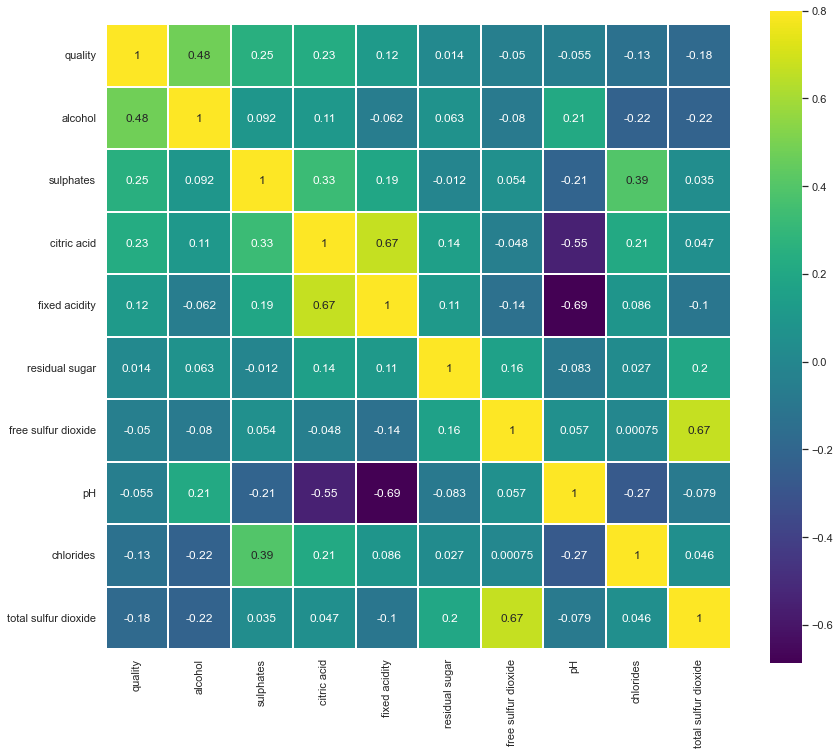

In [37]:
k= 10
cols = correlation.nlargest(k,'quality')['quality'].index
print(cols)
cm = np.corrcoef(df[cols].values.T)
f , ax = plt.subplots(figsize = (14,12))
sns.heatmap(cm, vmax=.8, linewidths=0.01,square=True,annot=True,cmap='viridis',
            linecolor="white",xticklabels = cols.values ,annot_kws = {'size':12},yticklabels = cols.values)

In [38]:
y=df['quality']
df=df.drop(['quality'],axis=1)

In [39]:
X_train, X_test, y_train, y_test = train_test_split(df,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [40]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(951, 11) (408, 11) (951,) (408,)


In [41]:
# Transformar os dados
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [42]:
X_train_std

array([[ 3.31616196, -0.67010558,  1.8291926 , ..., -1.99985681,
         0.90236307,  0.35241996],
       [ 0.51968377, -0.387402  , -0.21861594, ..., -1.0626813 ,
        -0.86300883, -0.93981891],
       [ 2.44226252, -0.387402  ,  1.8291926 , ..., -2.13373903,
         1.25543745, -0.2013967 ],
       ...,
       [-0.87855533, -0.33086129, -0.98654415, ..., -0.05856467,
        -0.03916861, -0.75521335],
       [ 0.34490388, -1.17897203,  0.19094577, ..., -0.92879908,
        -0.62762591, -0.01679115],
       [ 0.4614238 , -1.06589059,  0.75409311, ..., -0.86185797,
        -0.62762591,  0.90623661]])

In [43]:
X_test_std

array([[-0.35421567,  0.51724945, -1.191325  , ...,  0.20919976,
        -0.74531737, -0.84751613],
       [-0.06291586,  0.60206053, -0.88415372, ..., -0.12550578,
         0.54928869,  0.44472273],
       [ 0.05360407, -0.89626845,  0.80528833, ..., -0.92879908,
         0.90236307,  0.72163106],
       ...,
       [ 0.34490388,  0.3476273 ,  0.60050747, ...,  0.41002309,
        -0.45108872, -0.10909392],
       [ 0.9275035 , -1.17897203,  1.4708261 , ..., -1.0626813 ,
         0.43159723,  0.90623661],
       [ 1.04402343, -1.23551274,  0.39572662, ..., -0.46021132,
         1.02005453,  0.72163106]])

In [44]:
model_lin = LinearRegression()

In [45]:
# Treinar o modelo
model_lin.fit(X_train_std, y_train)

LinearRegression()

In [46]:
# Gerando as predições
y_pred = model_lin.predict(X_test_std)

In [47]:
y_pred

array([5.20601276, 5.80794046, 6.37839552, 5.15367312, 5.16750226,
       6.77514884, 5.73470854, 4.79469636, 5.83275894, 5.70543704,
       6.25294395, 5.9092998 , 6.03344825, 5.54223606, 6.29250125,
       5.26577971, 5.98615142, 5.31451491, 5.21354188, 5.88397933,
       5.22357396, 6.13169005, 5.29774422, 4.76010538, 5.75638592,
       4.78310043, 5.69428478, 5.37477087, 5.23690585, 5.34152794,
       6.05312294, 6.31583617, 5.77220141, 4.65304119, 5.61909201,
       6.25444472, 4.8521017 , 5.87743732, 5.26477632, 6.21207868,
       5.20286561, 5.76046454, 6.01550139, 4.62407791, 5.43790661,
       5.46435119, 5.07638529, 4.38727053, 5.12270188, 5.82943513,
       5.52957767, 6.1260587 , 5.91491236, 5.62848967, 6.28921261,
       5.15275593, 5.22886999, 5.20480431, 5.01558688, 6.02472051,
       4.89272727, 6.12395561, 5.14575604, 5.90720404, 5.78676722,
       5.94073106, 5.12583837, 5.47610782, 6.09571178, 6.12410372,
       5.58546665, 5.97538564, 5.97748928, 6.08530108, 5.82073

In [48]:
# Carregando as metricas
from sklearn.metrics import r2_score

In [49]:
# Calculando o R2
R2 = r2_score(y_test, y_pred)

# Mostra o resultado
print("R2 : ", R2)

R2 :  0.381537112941836


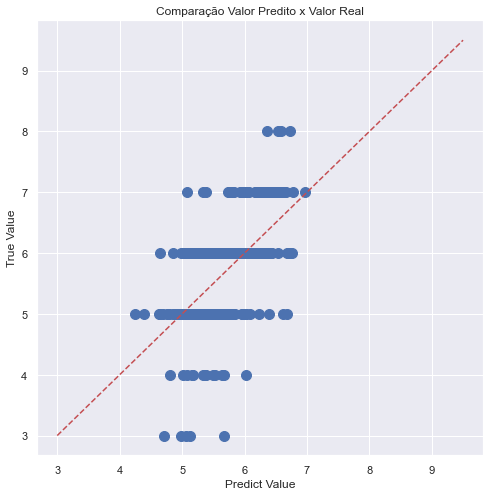

In [50]:
# Vamos criar um gráfico para comparar os Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [51]:
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(X_train_std, y_train)
y_pred_ridge = ridge.predict(X_test_std)

In [52]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_ridge)

# Mostra o resultado
print("R2 : ", R2)

R2 :  0.38176333175796795


In [53]:
from sklearn.linear_model import Lasso
# Instancia o modelo
lasso = Lasso()

# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
lasso.fit(X_train_std, y_train)

# Para os dados novos, vamos definir a predição para a base de teste
y_pred_lasso = lasso.predict(X_test_std)

In [54]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_lasso)

# Mostra o resultado
print("R2 : ", R2)

R2 :  -3.0023969703751874e-05


In [55]:
lasso.coef_

array([ 0., -0.,  0.,  0., -0., -0., -0., -0., -0.,  0.,  0.])

In [56]:
coef_table = pd.DataFrame(list(X_train.columns)).copy()


In [57]:
coef_table.insert(len(coef_table.columns),"Coefs",model_lin.coef_.transpose())
coef_table = coef_table.sort_values(by = ['Coefs'], ascending = False)
coef_table

,0,Coefs
10,alcohol,0.327805
9,sulphates,0.152365
5,free sulfur dioxide,0.068262
7,density,0.038427
2,citric acid,0.003862
3,residual sugar,-0.023914
0,fixed acidity,-0.054221
4,chlorides,-0.097252
8,pH,-0.123122
6,total sulfur dioxide,-0.124849


In [58]:
from sklearn.linear_model import ElasticNet

# Instancia o modelo
EN = ElasticNet()

# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
EN.fit(X_train_std, y_train)

# Para os dados novos, vamos definir a predição para a base de teste
y_pred_EN = EN.predict(X_test_std)

In [59]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_EN)

# Mostra o resultado
print("R2 : ", R2)

R2 :  -3.0023969703751874e-05


In [60]:
## Regressão Logística red wines

In [61]:
## transformação para a obtenção da target

y_train_class = np.where(y_train >= 6, 1,0)
y_test_class = np.where(y_test >= 6, 1,0)

In [62]:
#verificando se a classe é balanceada, a fim de se verificar 
# o uso correto da acurácia para avaliaçao do modelo.
pd.DataFrame(y_train_class).value_counts(normalize=True)


1    0.526814
0    0.473186
dtype: float64

In [63]:
# import da Regressão Logistica
from sklearn.linear_model import LogisticRegression

In [64]:
# Instancia o classificador
model = LogisticRegression(max_iter = 1000)

In [65]:
# Treinar o modelo
model.fit(X_train_std, y_train_class)

LogisticRegression(max_iter=1000)

In [66]:
y_pred_class = model.predict(X_test_std)
y_pred_class

array([0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0,

In [67]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from mlxtend.plotting import plot_confusion_matrix


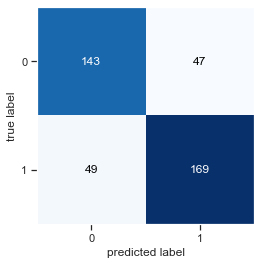

              precision    recall  f1-score   support

           0       0.74      0.75      0.75       190
           1       0.78      0.78      0.78       218

    accuracy                           0.76       408
   macro avg       0.76      0.76      0.76       408
weighted avg       0.76      0.76      0.76       408



In [68]:
cm = confusion_matrix(y_test_class, y_pred_class)
plot_confusion_matrix(cm)
plt.show()

print(classification_report(y_test_class, y_pred_class))

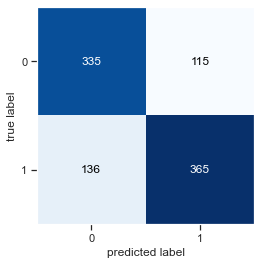

              precision    recall  f1-score   support

           0       0.71      0.74      0.73       450
           1       0.76      0.73      0.74       501

    accuracy                           0.74       951
   macro avg       0.74      0.74      0.74       951
weighted avg       0.74      0.74      0.74       951



In [69]:
cm = confusion_matrix(y_train_class, model.predict(X_train_std))
plot_confusion_matrix(cm)
plt.show()

print(classification_report(y_train_class, model.predict(X_train_std)))

<h1> Análise Conjunto de Vinhos Brancos </h1>

In [70]:
df_w = pd.read_csv('datasets/winequality-white.csv', sep=';')

In [71]:
df_w.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [72]:
df_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


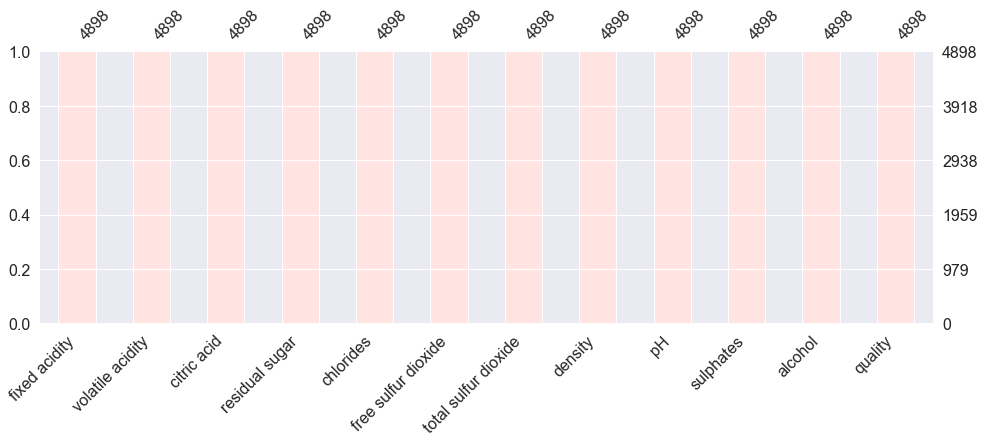

In [73]:
msno.bar(df_w, figsize = (16,5),color = "#FFE4E1")
plt.show()

In [74]:
df_w.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [75]:
df_w.duplicated().value_counts()

False    3961
True      937
dtype: int64

In [76]:
df_w.drop_duplicates(keep='first', inplace=True)

In [77]:
df_w.duplicated().value_counts()

False    3961
dtype: int64

In [78]:
columns=df_w.columns

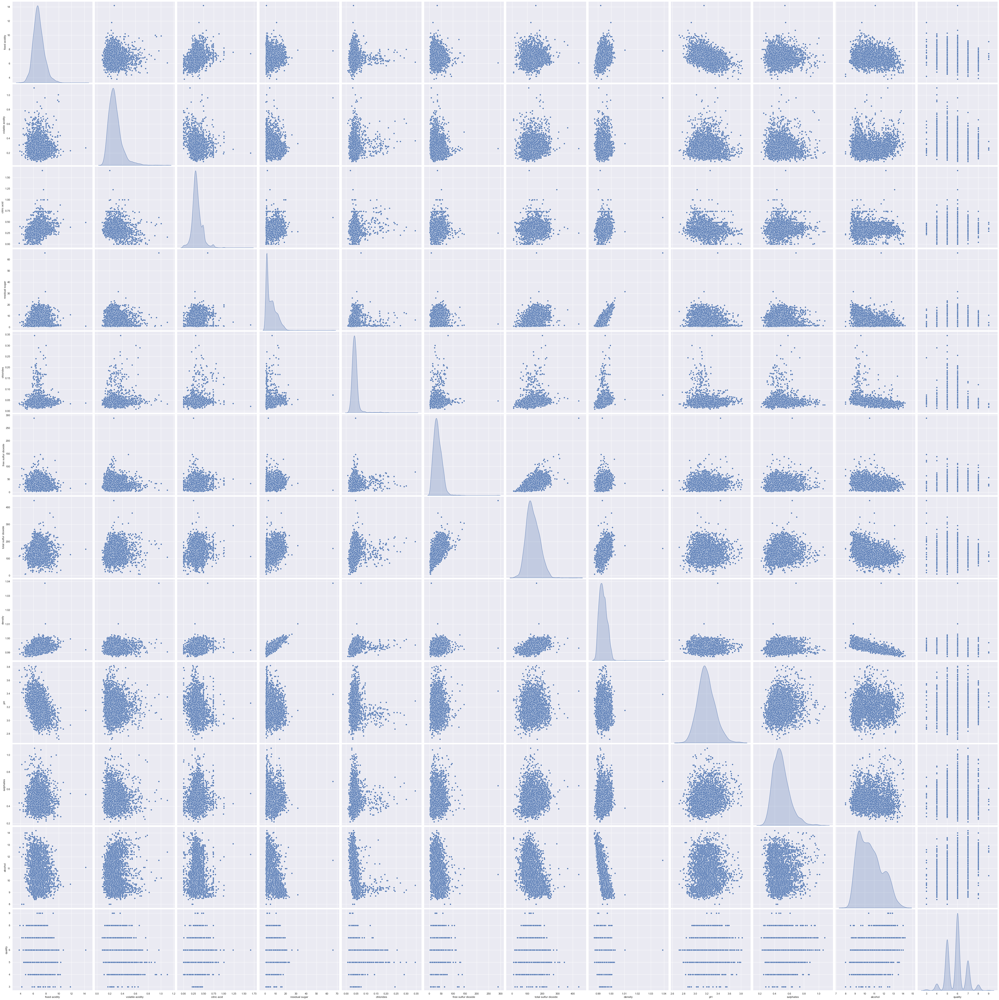

In [79]:
sns.set()
sns.pairplot(df_w[columns],height = 5 ,kind ='scatter',diag_kind='kde')
plt.show()

In [80]:
fig = go.Figure(data=[go.Pie(labels=df_w['quality'].value_counts().index, values=df_w['quality'].value_counts(), hole=.3)])
fig.update_layout(legend_title_text='Quality')
fig.show()

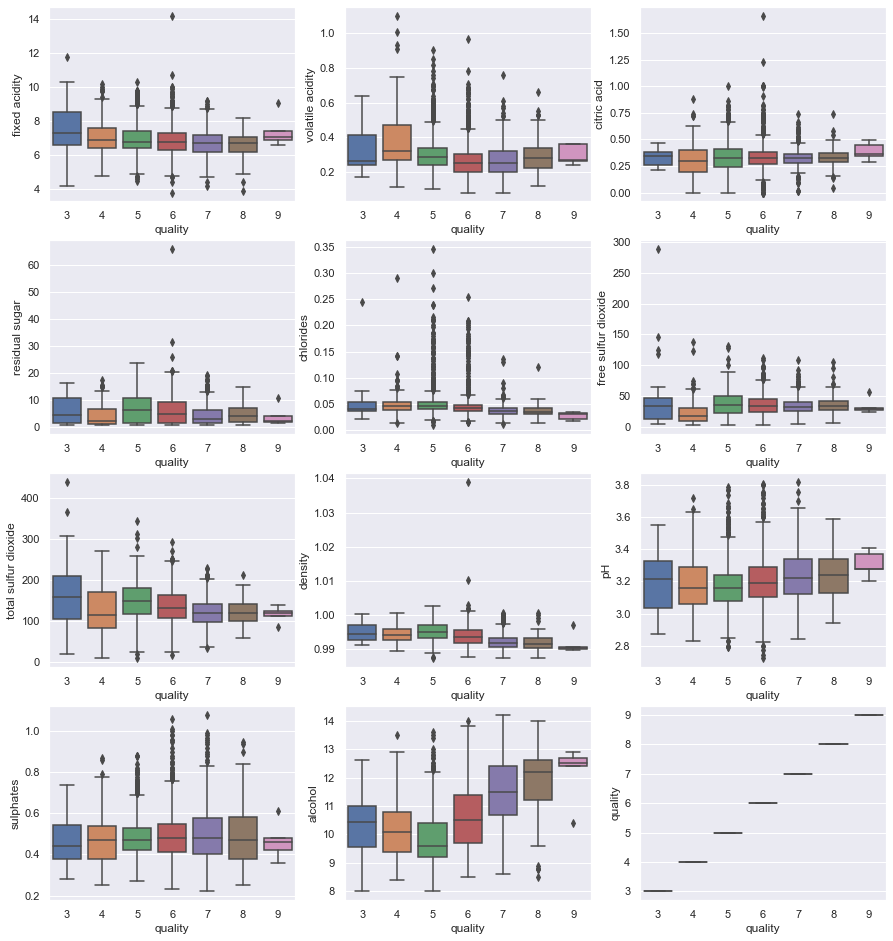

In [81]:
i=1
plt.figure(figsize=(15,25))
for feature in columns:
    plt.subplot(6,3,i)
    sns.boxplot(y=df_w[feature], x = df_w['quality'])
    i+=1

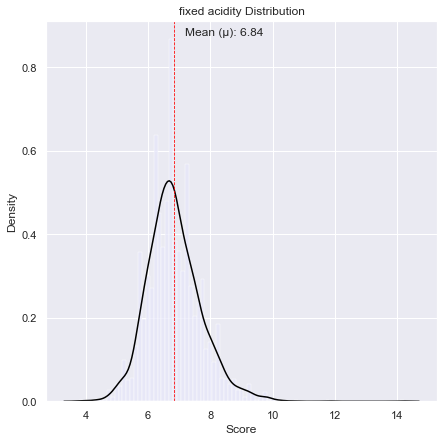

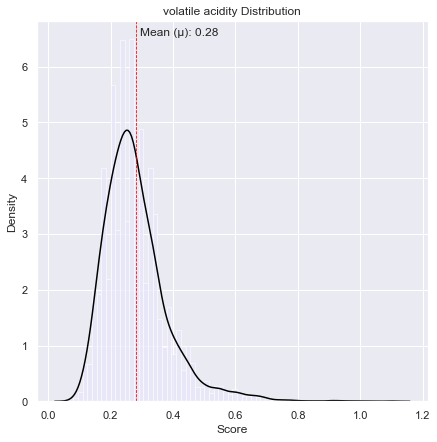

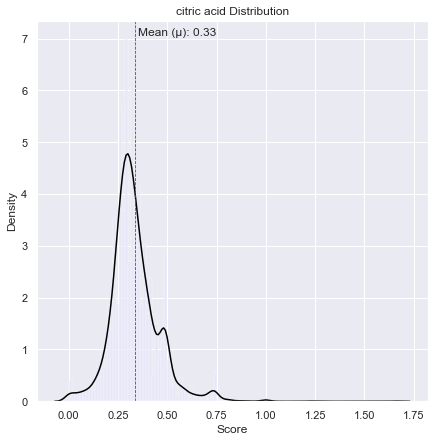

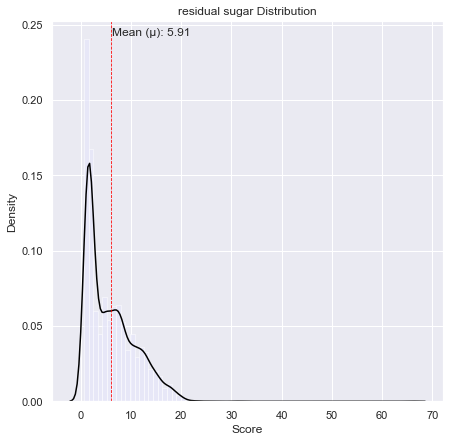

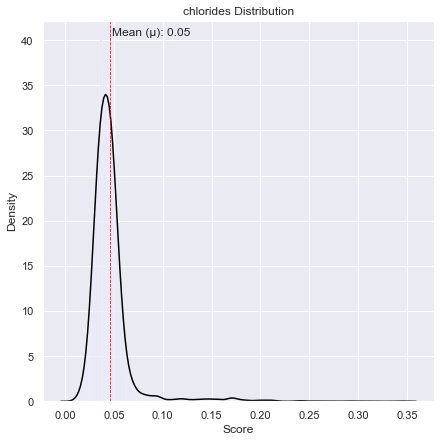

...

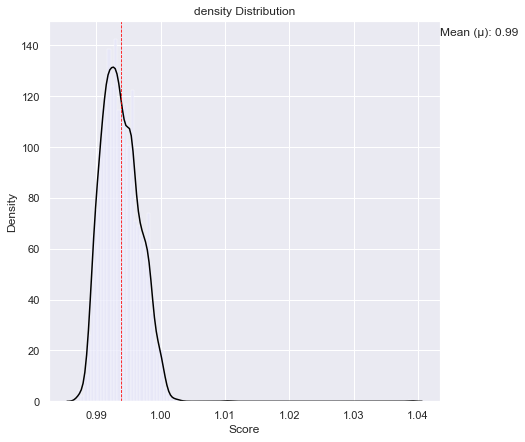

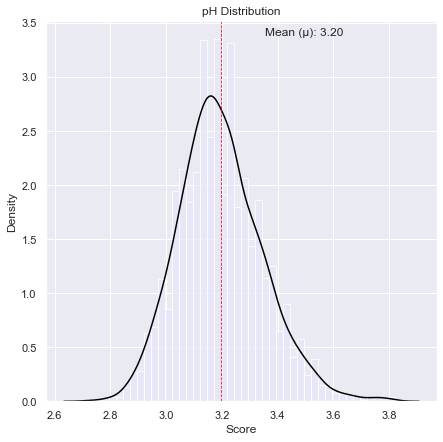

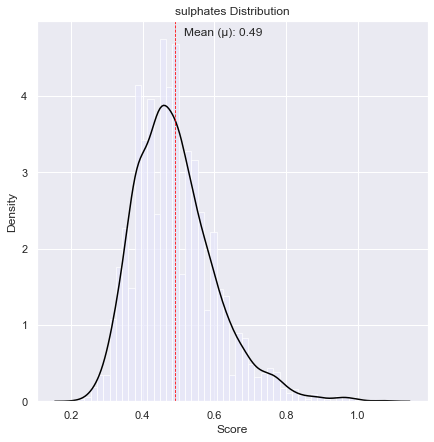

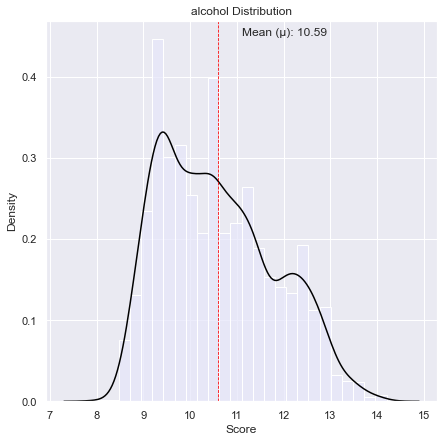

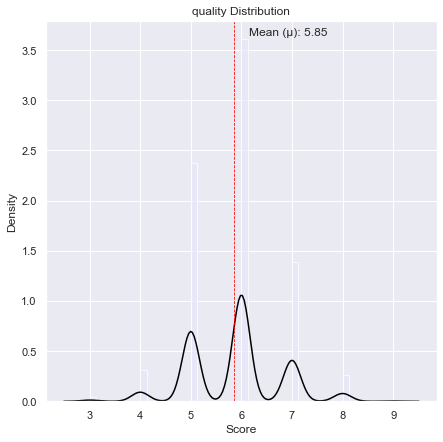

In [156]:
for column_name in df_w.columns:
  plt.figure(figsize=(7, 7))
  plt.title("{column_name} Distribution".format(column_name = column_name))
  sns.histplot(df_w[column_name], stat='density',color='#E6E6FA')
  sns.kdeplot(df_w[column_name], color='black')
  plt.axvline(df_w[column_name].mean(), color='red', linestyle='--', linewidth=0.8)
  min_ylim, max_ylim = plt.ylim()
  plt.text(df_w[column_name].mean()*1.05, max_ylim*0.96, 'Mean (μ): {:.2f}'.format(df_w[column_name].mean()))
  plt.xlabel("Score")
  plt.ylabel("Density")
  plt.show()

In [83]:
correlation = df_w.corr()
print(correlation['quality'].sort_values(ascending = False),'\n')

quality                 1.000000
alcohol                 0.462869
pH                      0.123829
sulphates               0.053200
free sulfur dioxide     0.010507
citric acid             0.007065
residual sugar         -0.117339
fixed acidity          -0.124636
total sulfur dioxide   -0.183356
volatile acidity       -0.190678
chlorides              -0.217739
density                -0.337805
Name: quality, dtype: float64 



Index(['quality', 'alcohol', 'pH', 'sulphates', 'free sulfur dioxide',
       'citric acid', 'residual sugar', 'fixed acidity',
       'total sulfur dioxide', 'volatile acidity'],
      dtype='object')


<AxesSubplot:>

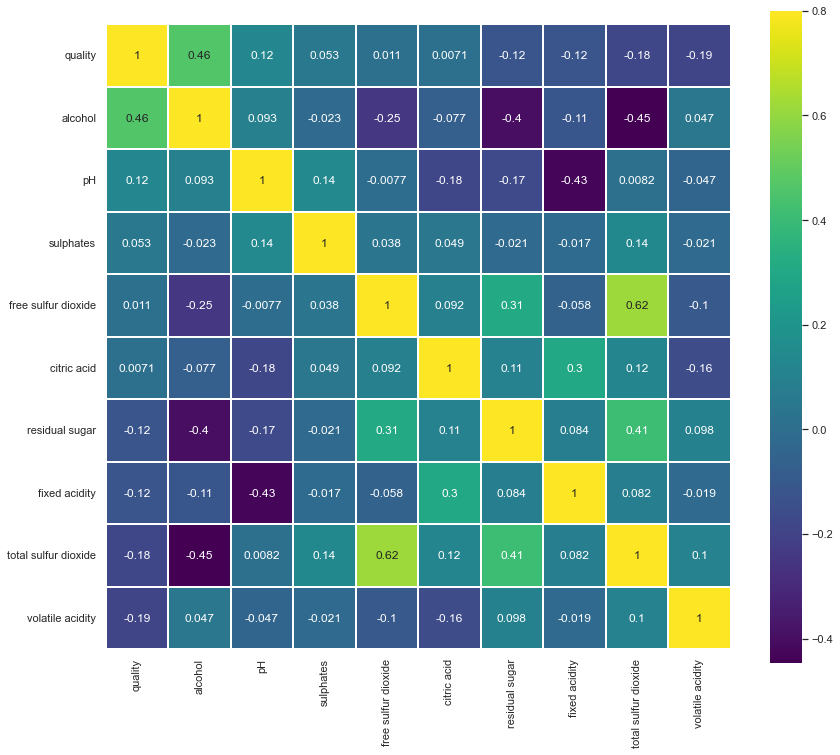

In [84]:
k= 10
cols = correlation.nlargest(k,'quality')['quality'].index
print(cols)
cm = np.corrcoef(df_w[cols].values.T)
f , ax = plt.subplots(figsize = (14,12))
sns.heatmap(cm, vmax=.8, linewidths=0.01,square=True,annot=True,cmap='viridis',
            linecolor="white",xticklabels = cols.values ,annot_kws = {'size':12},yticklabels = cols.values)

In [85]:
y=df_w['quality']
df=df_w.drop(['quality'],axis=1)

In [86]:
X_train, X_test, y_train, y_test = train_test_split(df_w,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [87]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2772, 12) (1189, 12) (2772,) (1189,)


In [88]:
# Transformar os dados
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [89]:
X_train_std

array([[ 0.67293361, -0.85988618,  1.26581403, ..., -0.98375962,
         0.33238064,  1.27718067],
       [-0.39103418,  1.4325102 ,  0.52955719, ...,  0.69530745,
        -1.31222806, -0.96638385],
       [ 0.0818404 , -0.85988618,  0.12052561, ...,  1.22553916,
         0.08568933,  0.15539841],
       ...,
       [-0.03637825, -0.85988618, -0.12489334, ..., -1.07213157,
         0.41461107,  2.39896292],
       [-1.10034603,  0.01805286,  0.0387193 , ...,  0.2534477 ,
         0.82576325,  0.15539841],
       [ 0.55471497,  0.79844312,  0.0387193 , ...,  0.69530745,
        -0.32546284, -0.96638385]])

In [90]:
X_test_std

array([[ 0.43649632,  0.40824799,  1.1022014 , ..., -0.71864377,
         1.64806759, -2.08816611],
       [ 3.39196239, -0.37214227,  0.93858877, ..., -0.18841206,
         0.16791977,  0.15539841],
       [ 0.43649632, -0.07949592,  3.31097193, ..., -0.45352791,
        -1.55891936, -0.96638385],
       ...,
       [ 0.31827768, -0.07949592, -0.53392492, ...,  0.2534477 ,
         0.74353281,  1.27718067],
       [-0.50925282, -0.07949592, -1.35198807, ..., -0.18841206,
        -0.98330632, -0.96638385],
       [-1.33678332, -0.27459349, -0.94295649, ..., -0.36515596,
        -0.40769327,  0.15539841]])

In [91]:
model_lin = LinearRegression()

In [92]:
# Treinar o modelo
model_lin.fit(X_train_std, y_train)

LinearRegression()

In [93]:
# Gerando as predições
y_pred = model_lin.predict(X_test_std)

In [94]:
y_pred

array([4., 6., 5., ..., 7., 5., 6.])

In [95]:
# Carregando as metricas
from sklearn.metrics import r2_score

In [96]:
# Calculando o R2
R2 = r2_score(y_test, y_pred)

# Mostra o resultado
print("R2 : ", R2)

R2 :  1.0


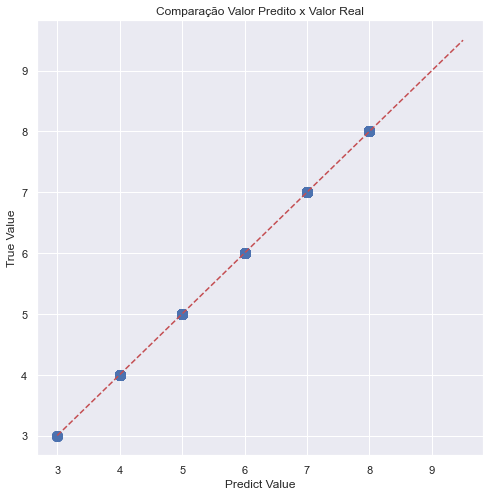

In [97]:
# Vamos criar um gráfico para comparar os Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [98]:
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(X_train_std, y_train)
y_pred_ridge = ridge.predict(X_test_std)

In [99]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_ridge)

# Mostra o resultado
print("R2 : ", R2)

R2 :  0.9999998017879079


In [100]:
from sklearn.linear_model import Lasso
# Instancia o modelo
lasso = Lasso()

# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
lasso.fit(X_train_std, y_train)

# Para os dados novos, vamos definir a predição para a base de teste
y_pred_lasso = lasso.predict(X_test_std)

In [101]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_lasso)

# Mostra o resultado
print("R2 : ", R2)

R2 :  -0.0006195134505069255


In [102]:
lasso.coef_

array([-0., -0.,  0., -0., -0.,  0., -0., -0.,  0.,  0.,  0.,  0.])

In [103]:
coef_table = pd.DataFrame(list(X_train.columns)).copy()

In [104]:
coef_table.insert(len(coef_table.columns),"Coefs",model_lin.coef_.transpose())
coef_table = coef_table.sort_values(by = ['Coefs'], ascending = False)
coef_table

,0,Coefs
11,quality,8.914386e-01
3,residual sugar,2.126771e-15
4,chlorides,6.847821e-16
8,pH,5.689893e-16
0,fixed acidity,4.899863e-16
1,volatile acidity,2.220446e-16
6,total sulfur dioxide,1.942890e-16
2,citric acid,8.326673e-17
9,sulphates,-2.011449e-16
10,alcohol,-7.494005e-16


In [105]:
from sklearn.linear_model import ElasticNet

# Instancia o modelo
EN = ElasticNet()

# Fit dos dados (ou seja, vamos passar os dados para o modelo aprender com eles)
EN.fit(X_train_std, y_train)

# Para os dados novos, vamos definir a predição para a base de teste
y_pred_EN = EN.predict(X_test_std)

In [106]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_EN)

# Mostra o resultado
print("R2 : ", R2)

R2 :  0.49947233609309905


<h2>Regressão Logística white wines</h2> 

In [107]:
## transformação para a obtenção da target

y_train_class = np.where(y_train >= 6, 1,0)
y_test_class = np.where(y_test >= 6, 1,0)

In [108]:
#verificando se a classe é balanceada, a fim de se verificar 
# o uso correto da acurácia para avaliaçao do modelo.
pd.DataFrame(y_train_class).value_counts(normalize=True)

1    0.662338
0    0.337662
dtype: float64

In [109]:
# import da Regressão Logistica
from sklearn.linear_model import LogisticRegression

In [110]:
# Instancia o classificador
model = LogisticRegression(max_iter = 1000)

In [111]:
# Treinar o modelo
model.fit(X_train_std, y_train_class)

LogisticRegression(max_iter=1000)

In [112]:
y_pred_class = model.predict(X_test_std)
y_pred_class

array([0, 1, 0, ..., 1, 0, 1])

In [113]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from mlxtend.plotting import plot_confusion_matrix

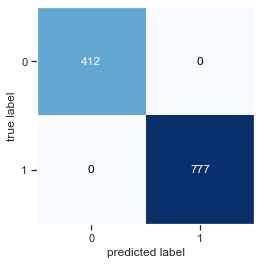

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       412
           1       1.00      1.00      1.00       777

    accuracy                           1.00      1189
   macro avg       1.00      1.00      1.00      1189
weighted avg       1.00      1.00      1.00      1189



In [114]:
cm = confusion_matrix(y_test_class, y_pred_class)
plot_confusion_matrix(cm)
plt.show()

print(classification_report(y_test_class, y_pred_class))

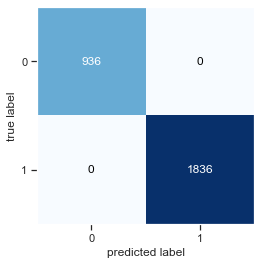

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       936
           1       1.00      1.00      1.00      1836

    accuracy                           1.00      2772
   macro avg       1.00      1.00      1.00      2772
weighted avg       1.00      1.00      1.00      2772



In [115]:
cm = confusion_matrix(y_train_class, model.predict(X_train_std))
plot_confusion_matrix(cm)
plt.show()

print(classification_report(y_train_class, model.predict(X_train_std)))

## Unindo os 2 datasets

In [116]:
df_red = pd.read_csv('datasets/winequality-red.csv', sep=';')
df_white = pd.read_csv('datasets/winequality-white.csv', sep=';')

df_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [117]:
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [118]:
df_red.duplicated().value_counts()

False    1359
True      240
dtype: int64

In [119]:
df_white.duplicated().value_counts()

False    3961
True      937
dtype: int64

In [120]:
df_red.drop_duplicates(keep='first', inplace=True)
df_white.drop_duplicates(keep='first', inplace=True)

In [121]:
df_red.duplicated().value_counts()

False    1359
dtype: int64

In [122]:
df_white.duplicated().value_counts()

False    3961
dtype: int64

In [123]:
df_unidos = pd.concat([df_red, df_white])

In [124]:
len(df_unidos)

5320

In [125]:
df_unidos.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000
mean,7.215179,0.344130,0.318494,5.048477,0.056690,30.036654,114.109023,0.994535,3.224664,0.533357,10.549241,5.795677
std,1.319671,0.168248,0.147157,4.500180,0.036863,17.805045,56.774223,0.002966,0.160379,0.149743,1.185933,0.879772
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.240000,1.800000,0.038000,16.000000,74.000000,0.992200,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.300000,0.310000,2.700000,0.047000,28.000000,116.000000,0.994650,3.210000,0.510000,10.400000,6.000000
75%,7.700000,0.410000,0.400000,7.500000,0.066000,41.000000,153.250000,0.996770,3.330000,0.600000,11.400000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [126]:
df_unidos.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5


In [127]:
df_unidos.duplicated().value_counts()

False    5318
True        2
dtype: int64

In [128]:
df_unidos.drop_duplicates(keep='first', inplace=True)

In [129]:
columns=df_unidos.columns

In [130]:
fig = go.Figure(data=[go.Pie(labels=df_unidos['quality'].value_counts().index, values=df_unidos['quality'].value_counts(), hole=.3)])
fig.update_layout(legend_title_text='Quality')
fig.show()

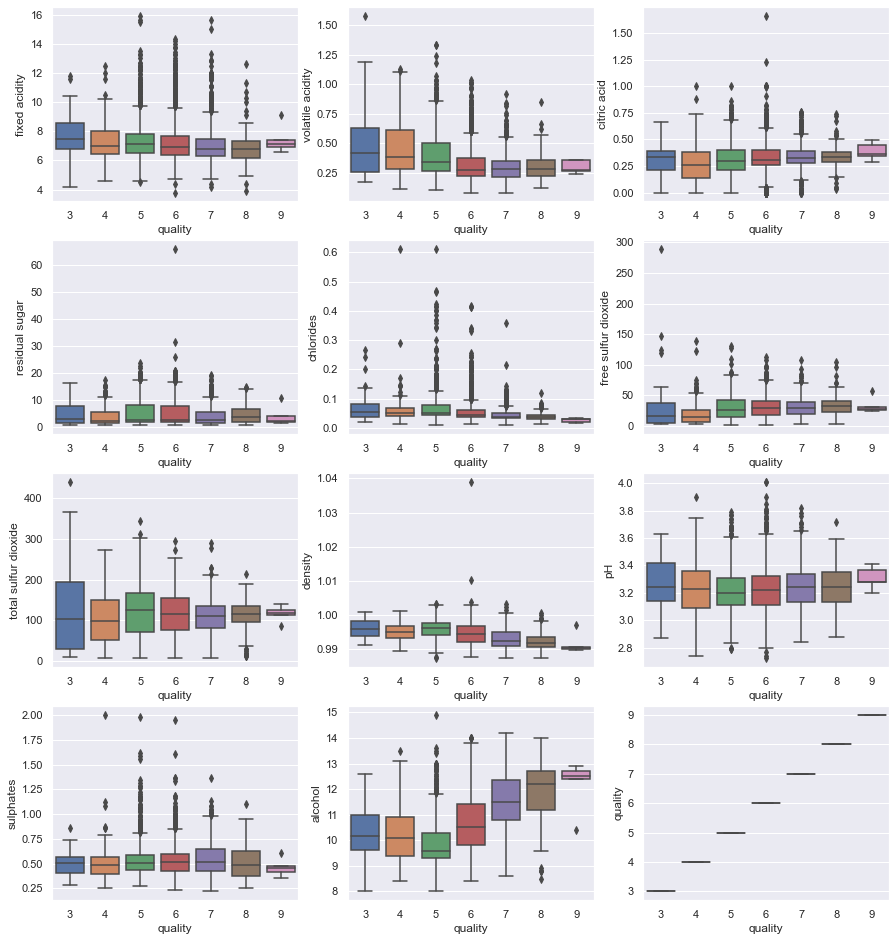

In [131]:
i=1
plt.figure(figsize=(15,25))
for feature in columns:
    plt.subplot(6,3,i)
    sns.boxplot(y=df_unidos[feature], x = df_unidos['quality'])
    i+=1

In [132]:
correlation = df_unidos.corr()
print(correlation['quality'].sort_values(ascending = False),'\n')

quality                 1.000000
alcohol                 0.469216
citric acid             0.097926
free sulfur dioxide     0.054199
sulphates               0.042040
pH                      0.039789
total sulfur dioxide   -0.050183
residual sugar         -0.056824
fixed acidity          -0.080190
chlorides              -0.201960
volatile acidity       -0.265354
density                -0.326301
Name: quality, dtype: float64 



Index(['quality', 'alcohol', 'citric acid', 'free sulfur dioxide', 'sulphates',
       'pH', 'total sulfur dioxide', 'residual sugar', 'fixed acidity',
       'chlorides'],
      dtype='object')


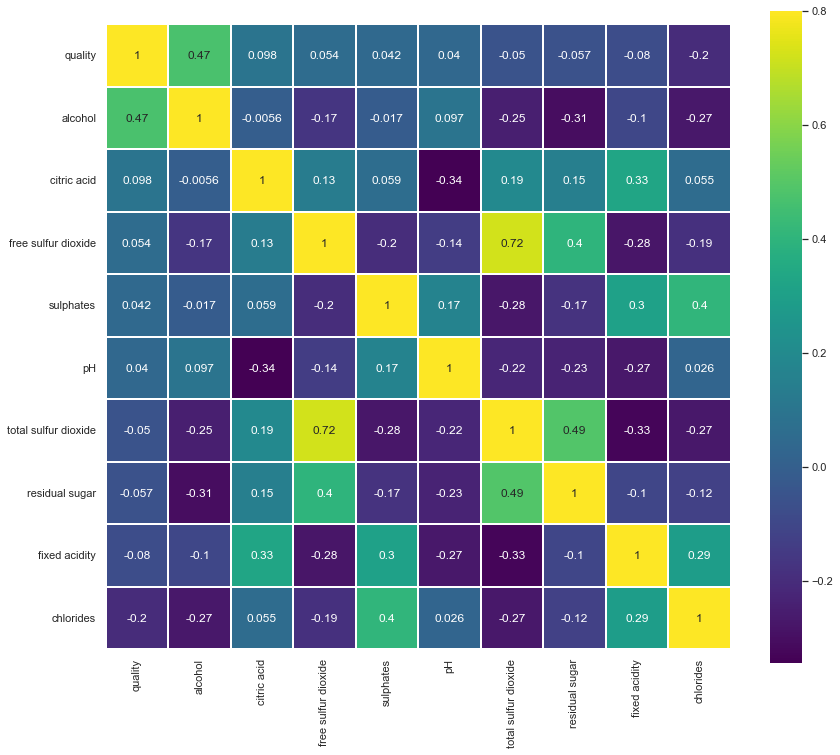

In [133]:
k= 10
cols = correlation.nlargest(k,'quality')['quality'].index
print(cols)
cm = np.corrcoef(df_unidos[cols].values.T)
f , ax = plt.subplots(figsize = (14,12))
sns.heatmap(cm, vmax=.8, linewidths=0.01,square=True,annot=True,cmap='viridis',
            linecolor="white",xticklabels = cols.values ,annot_kws = {'size':12},yticklabels = cols.values);

### - Regressão Linear

In [134]:
y = df_unidos['quality']
X = df_unidos.drop(['quality'],axis=1)

In [135]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 42)

In [136]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(3722, 11) (1596, 11) (3722,) (1596,)


In [137]:
# Transformar os dados
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [138]:
X_train_std

array([[-0.30540005, -0.85702453, -0.45162637, ..., -0.82880655,
         0.06814291,  0.21870097],
       [-0.69280981,  0.39786726, -1.06558603, ..., -0.39401896,
        -0.77214837, -0.87656193],
       [-0.53784591,  0.27835376, -0.58806185, ...,  1.34513142,
         0.13816719,  1.31396386],
       ...,
       [-1.31266543, -1.09605153, -0.38340863, ...,  1.28301891,
         1.6787012 ,  1.22971287],
       [-1.15770153, -0.08018675,  0.02589781, ...,  0.53766875,
        -0.21195418,  1.48246585],
       [ 1.32172095, -0.13994351, -0.04231993, ..., -0.33190644,
         0.13816719, -0.118303  ]])

In [139]:
X_test_std

array([[-0.46036395, -0.67775427,  0.02589781, ..., -0.02134388,
        -0.98222119,  1.81946982],
       [-0.61532786, -0.25945701, -0.31519089, ...,  0.04076864,
        -0.63209982,  1.39821486],
       [-0.84777372, -1.09605153,  0.36698652, ...,  1.09668137,
         0.34824001, -0.03405201],
       ...,
       [ 0.31445557,  0.27835376,  0.98094618, ..., -1.94683179,
        -0.14192991, -1.29781689],
       [-0.61532786,  0.03932675,  1.32203488, ..., -0.64246901,
        -0.56207555, -0.79231094],
       [-1.08021957, -0.37897051,  0.16233329, ...,  1.03456885,
        -0.98222119,  1.90372081]])

In [140]:
model_lin_unidos = LinearRegression()

# Treinar o modelo
model_lin_unidos.fit(X_train_std, y_train)

# Gerando as predições
y_pred = model_lin_unidos.predict(X_test_std)

In [141]:
# Calculando o R2
R2 = r2_score(y_test, y_pred)

# Mostra o resultado
print("R2 : ", R2)

R2 :  0.31241898483682673


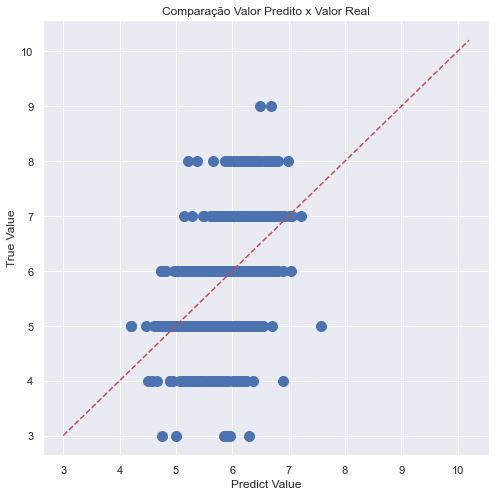

In [142]:
# Vamos criar um gráfico para comparar os Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [143]:
# Testando Ridge

ridge_unidos = Ridge()
ridge_unidos.fit(X_train_std, y_train)
y_pred_ridge_unidos = ridge_unidos.predict(X_test_std)

In [144]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_ridge_unidos)

# Mostra o resultado
print("R2 : ", R2)

R2 :  0.31242318913057754


In [145]:
# Testando Lasso
lasso_unidos = Lasso()
lasso_unidos.fit(X_train_std, y_train)
y_pred_lasso_unidos = lasso_unidos.predict(X_test_std)

In [146]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_lasso_unidos)

# Mostra o resultado
print("R2 : ", R2)

R2 :  -0.00028151419073818573


In [147]:
coef_table = pd.DataFrame(list(X_train.columns)).copy()
coef_table.insert(len(coef_table.columns),"Coefs",model_lin_unidos.coef_.transpose())
coef_table = coef_table.sort_values(by = ['Coefs'], ascending = False)
coef_table

,0,Coefs
10,alcohol,0.314900
3,residual sugar,0.173230
5,free sulfur dioxide,0.124209
9,sulphates,0.118261
8,pH,0.087447
0,fixed acidity,0.079227
2,citric acid,0.025236
4,chlorides,-0.026588
6,total sulfur dioxide,-0.150166
7,density,-0.177785


In [148]:
# Testando Elastic Net

EN_unidos = ElasticNet()
EN_unidos.fit(X_train_std, y_train)
y_pred_EN_unidos = EN_unidos.predict(X_test_std)

In [149]:
# Calculando o R2
R2 = r2_score(y_test, y_pred_EN_unidos)

# Mostra o resultado
print("R2 : ", R2)

R2 :  -0.00028151419073818573


### - Regressão Logística

In [150]:
## transformação para a obtenção da target

y_train_class = np.where(y_train >= 6, 1,0)
y_test_class = np.where(y_test >= 6, 1,0)

In [151]:
#verificando se a classe é balanceada, a fim de se verificar 
# o uso correto da acurácia para avaliaçao do modelo.
pd.DataFrame(y_train_class).value_counts(normalize=True)

1    0.625739
0    0.374261
dtype: float64

In [152]:
# Instancia o classificador
model_log_unidos = LogisticRegression(max_iter = 1000)
model_log_unidos.fit(X_train_std, y_train_class)

LogisticRegression(max_iter=1000)

In [153]:
y_pred_class = model_log_unidos.predict(X_test_std)
y_pred_class

array([1, 1, 1, ..., 0, 0, 1])

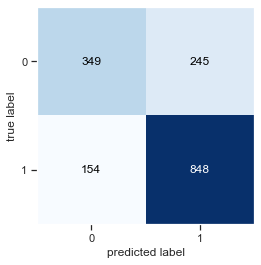

              precision    recall  f1-score   support

           0       0.69      0.59      0.64       594
           1       0.78      0.85      0.81      1002

    accuracy                           0.75      1596
   macro avg       0.73      0.72      0.72      1596
weighted avg       0.75      0.75      0.75      1596



In [154]:
cm = confusion_matrix(y_test_class, y_pred_class)
plot_confusion_matrix(cm)
plt.show()

print(classification_report(y_test_class, y_pred_class))

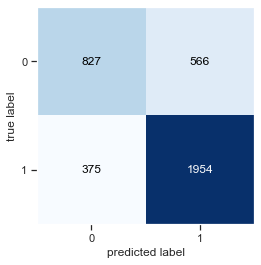

              precision    recall  f1-score   support

           0       0.69      0.59      0.64      1393
           1       0.78      0.84      0.81      2329

    accuracy                           0.75      3722
   macro avg       0.73      0.72      0.72      3722
weighted avg       0.74      0.75      0.74      3722



In [155]:
cm = confusion_matrix(y_train_class, model_log_unidos.predict(X_train_std))
plot_confusion_matrix(cm)
plt.show()

print(classification_report(y_train_class, model_log_unidos.predict(X_train_std)))